---


1. First let's download dataset: [ADDI project](https://www.fc.up.pt/addi/ph2%20database.html).

<table><tr><td>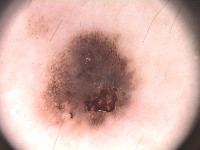</td><td>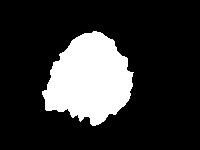</td></tr></table>

2. Unzip the .rar file.

This is photos of two types of skin **lesions**: melanoma and mole.
In this problem we will **segment** images

I made this notebook in Kaggle

The dataset structure is as follows:

    IMD_002/
        IMD002_Dermoscopic_Image/
            IMD002.bmp
        IMD002_lesion/
            IMD002_lesion.bmp
        IMD002_roi/
            ...
    IMD_003/
        ...
        ...

 Here `X.bmp` is the image to be segmented, and `X_lesion.bmp` is the segmentation result.

To load the dataset, you can use skimage: [`skimage.io.imread()`](https://scikit-image.org/docs/dev/api/skimage.io.html)

In [ ]:
images = []
lesions = []
from skimage.io import imread
import os

# changed directory due to kaggle
root = '/kaggle/input/ph2dataset/PH2Dataset'

for root, dirs, files in os.walk(os.path.join(root, 'PH2_Dataset')):
    if root.endswith('_Dermoscopic_Image'):
        images.append(imread(os.path.join(root, files[0])))
    if root.endswith('_lesion'):
        lesions.append(imread(os.path.join(root, files[0])))

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


The images have different sizes. Let's resize them to $256\times256$ pixels. To resize the images, you can use  [`skimage.transform.resize()`](https://scikit-image.org/docs/dev/api/skimage.transform.html#skimage.transform.resize).
This function also automatically normalizes the images to the range $[0,1]$.


In [ ]:
from skimage.transform import resize

size = (256, 256)
X = [resize(x, size, mode='constant', anti_aliasing=True,) for x in images]
Y = [resize(y, size, mode='constant', anti_aliasing=False) > 0.5 for y in lesions]

In [ ]:
import numpy as np

X = np.array(X, np.float32)
Y = np.array(Y, np.float32)
print(f'Loaded {len(X)} images')

Loaded 200 images


Let's see our images and lesions and make sure that we unziped correctly.

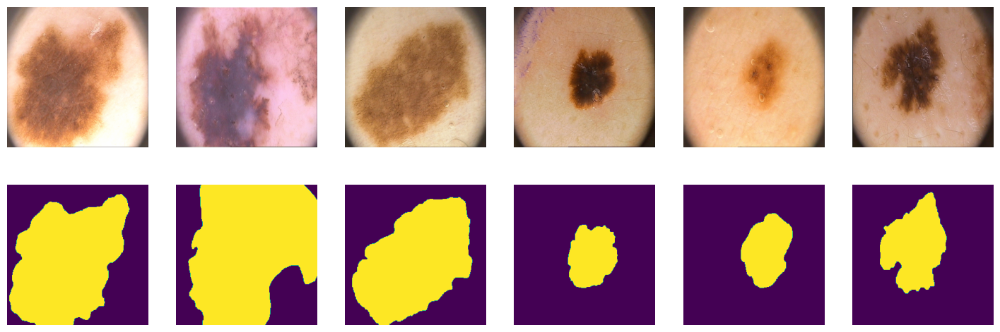

In [ ]:
import matplotlib.pyplot as plt
from IPython.display import clear_output

plt.figure(figsize=(18, 6))
for i in range(6):
    plt.subplot(2, 6, i+1)
    plt.axis("off")
    plt.imshow(X[i])

    plt.subplot(2, 6, i+7)
    plt.axis("off")
    plt.imshow(Y[i])

plt.show()

Let's split our 200 images into 100/50/50 for training, validation, and testing, respectively.

In [ ]:
ix = np.random.choice(len(X), len(X), False)
tr, val, ts = np.split(ix, [100, 150])

In [ ]:
print(len(tr), len(val), len(ts))

100 50 50


#### PyTorch DataLoader

In [ ]:
%%capture

# for checking model architecture
!pip install torchinfo

In [ ]:
from torch.utils.data import DataLoader

batch_size = 16

data_tr = DataLoader(list(zip(np.rollaxis(X[tr], 3, 1), Y[tr, np.newaxis])),
                     batch_size=batch_size, shuffle=True)

data_val = DataLoader(list(zip(np.rollaxis(X[val], 3, 1), Y[val, np.newaxis])),
                      batch_size=batch_size, shuffle=True)

data_ts = DataLoader(list(zip(np.rollaxis(X[ts], 3, 1), Y[ts, np.newaxis])),
                     batch_size=batch_size, shuffle=True)

In [ ]:
import torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


# Implementation of various architectures:
Our task will be to write several neural network architectures for solving the semantic segmentation task, and compare them in terms of quality on the test set and try out various loss functions for them.

-----------------------------------------------------------------------------------------

# SegNet

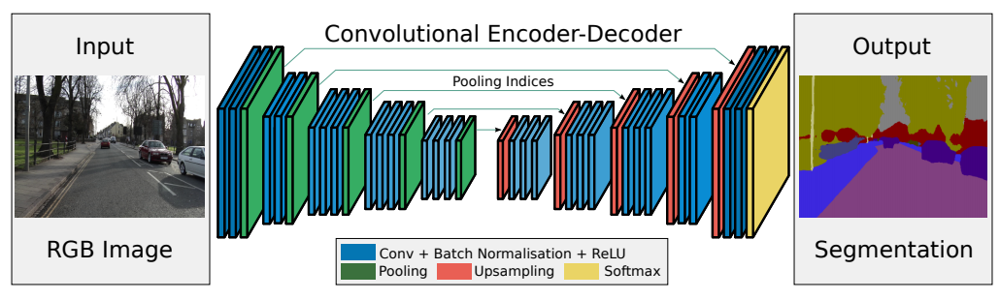

* Badrinarayanan, V., Kendall, A., & Cipolla, R. (2015). [SegNet: A deep convolutional
encoder-decoder architecture for image segmentation](https://arxiv.org/pdf/1511.00561.pdf)

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torch.optim as optim
from time import time

from matplotlib import rcParams
rcParams['figure.figsize'] = (15,4)

In [ ]:
class SegNet(nn.Module):
    def __init__(self):
        super().__init__()

        self.enc_conv0 = nn.Sequential(nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=64),
                                       nn.ReLU(inplace=True),

                                       nn.Conv2d(in_channels=64, out_channels=64,kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=64),
                                       nn.ReLU(inplace=True))

        # 256 -> 128
        self.pool0 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)

        self.enc_conv1 = nn.Sequential(nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=128),
                                       nn.ReLU(inplace=True),

                                       nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=128),
                                       nn.ReLU(inplace=True))

        # 128 -> 64
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)

        self.enc_conv2 = nn.Sequential(nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=256),
                                       nn.ReLU(inplace=True),

                                       nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=256),
                                       nn.ReLU(inplace=True),

                                       nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=256),
                                       nn.ReLU(inplace=True))

        # 64 -> 32
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)

        self.enc_conv3 = nn.Sequential(nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=512),
                                       nn.ReLU(inplace=True),

                                       nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=512),
                                       nn.ReLU(inplace=True),

                                       nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=512),
                                       nn.ReLU(inplace=True))

        # 32 -> 16
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)

        # bottleneck
        self.bottleneck_conv = nn.Sequential(nn.Conv2d(in_channels=512, out_channels=256, kernel_size=1, stride=1),
                                             nn.BatchNorm2d(256),
                                             nn.ReLU(inplace=True),

                                             nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1, stride=1),
                                             nn.BatchNorm2d(256),
                                             nn.ReLU(inplace=True),

                                             nn.Conv2d(in_channels=256, out_channels=512, kernel_size=1),
                                             nn.BatchNorm2d(512),
                                             nn.ReLU(inplace=True))

        # decoder (upsampling)

        # 16 -> 32
        self.upsample0 = nn.MaxUnpool2d(kernel_size=2, stride=2)

        self.dec_conv0 = nn.Sequential(nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=512),
                                       nn.ReLU(inplace=True),

                                       nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=512),
                                       nn.ReLU(inplace=True),

                                       nn.Conv2d(in_channels=512, out_channels=256, kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=256),
                                       nn.ReLU(inplace=True))

        # 32 -> 64
        self.upsample1 = nn.MaxUnpool2d(kernel_size=2, stride=2)

        self.dec_conv1 = nn.Sequential(nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=256),
                                       nn.ReLU(inplace=True),

                                       nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=256),
                                       nn.ReLU(inplace=True),

                                       nn.Conv2d(in_channels=256, out_channels=128, kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=128),
                                       nn.ReLU(inplace=True))

        # 64 -> 128
        self.upsample2 = nn.MaxUnpool2d(kernel_size=2, stride=2)

        self.dec_conv2 = nn.Sequential(nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=128),
                                       nn.ReLU(inplace=True),

                                       nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=64),
                                       nn.ReLU(inplace=True))

        # 128 -> 256
        self.upsample3 = nn.MaxUnpool2d(kernel_size=2, stride=2)

        self.dec_conv3 = nn.Sequential(nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=64),
                                       nn.ReLU(inplace=True),

                                       nn.Conv2d(in_channels=64, out_channels=1, kernel_size=3, padding=1, stride=1))

    def forward(self, x):
        # encoder
        e0, ind0 = self.pool0(self.enc_conv0(x))
        e1, ind1 = self.pool1(self.enc_conv1(e0))
        e2, ind2 = self.pool2(self.enc_conv2(e1))
        e3, ind3 = self.pool3(self.enc_conv3(e2))

        # bottleneck
        b = self.bottleneck_conv(e3)

        # decoder
        d0 = self.dec_conv0(self.upsample0(b, ind3))
        d1 = self.dec_conv1(self.upsample1(d0, ind2))
        d2 = self.dec_conv2(self.upsample2(d1, ind1))
        d3 = self.dec_conv3(self.upsample3(d2, ind0))
        return d3

## Metric

Let's use following metric for quality evaluation:
$I o U=\frac{\text {target } \cap \text { prediction }}{\text {target } \cup{prediction }}$

A metric close to one indicates better performance.

For example, let's look at the ground truth (left) and the prediction (right):![alt text](https://www.jeremyjordan.me/content/images/2018/05/target_prediction.png)


Then intersection will look like this:

![alt text](https://www.jeremyjordan.me/content/images/2018/05/intersection_union.png)

In [ ]:
def iou_pytorch(outputs: torch.Tensor, labels: torch.Tensor):
    # You can comment out this line if you are passing tensors of equal shape
    # But if you are passing output from UNet or something it will most probably
    # be with the BATCH x 1 x H x W shape

    #outputs = outputs.squeeze(1).byte()  # BATCH x 1 x H x W => BATCH x H x W
    #labels = labels.squeeze(1).byte()
    SMOOTH = 1e-8
    outputs = outputs.byte()
    labels = labels.byte()
    intersection = (outputs & labels).float().sum()  # Will be zero if Truth=0 or Prediction=0
    union = (outputs | labels).float().sum()         # Will be zzero if both are 0
    iou = (intersection + SMOOTH) / (union + SMOOTH)  # We smooth our devision to avoid 0/0
    return iou  #

## Loss function

A popular method for binary segmentation is binary cross-entropy, which is defined as follows:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

where y represents the target of the desired outcome, $\hat y$ is the output of the model, and $\sigma$  is the logistic function, which transforms a real number R into a probability in the range [0,1]





However, this loss suffers from numerical instability issues. Most notably, $\lim_{x\rightarrow0}\log(x)=\infty$, which leads to instability during optimization. It is recommended to consider the following simplification. This function is equivalent to the first one and is less susceptible to numerical instability:

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right).$$

We have to minimize loss function to get better quality.

In [ ]:
def bce_loss(y_real, y_pred):
    return (y_pred - y_real * y_pred + torch.log(1 + torch.exp(-y_pred))).mean()

## Training

We will define the training loop within a function so that we can reuse it.

In [ ]:
%%capture
!pip install vapeplot

In [ ]:
import vapeplot

vapeplot.set_palette('cool')

In [ ]:
def plot_train_history(history):
    fig1, axes1 = plt.subplots(nrows=1, ncols=2)

    axes1[0].plot(history['epoch'], history['train_loss'], label='train_loss')
    axes1[0].plot(history['epoch'], history['val_loss'], label='val_loss')
    axes1[0].grid()
    axes1[0].legend()

    axes1[1].plot(history['epoch'], history['train_metric'], label='train_score')
    axes1[1].plot(history['epoch'], history['val_metric'], label='val_score')
    axes1[1].grid()
    axes1[1].legend()

In [ ]:
def plot_weights(grads, layers, ax, alpha=1, color='red'):
    patch_artist = False if alpha == 1 else True

    box_plot = ax.boxplot(grads, showfliers=False, notch=True, patch_artist=patch_artist)

    for i, (box, label) in enumerate(zip(box_plot['boxes'], layers)):
        if alpha == 1:
            x = box.get_xdata()[0] - 0.01
            y = box.get_ydata().mean()
            ax.text(x, y, label, ha='right', va='center', rotation=90, fontweight='bold')
        else:
            box.set_facecolor(color)
            box.set_alpha(alpha)

    ax.set_xlabel('Layer')
    ax.set_ylabel('Abs Weights Value (log scale)')

    if alpha == 1:
        ax.grid()

In [ ]:
def train(model, opt, loss_fn, epochs, data_tr, data_val, metric):

    # train history for stats
    history = {'epoch': [], 'weights': {'w': [], 'layers': []},
               'train_loss': [], 'val_loss': [],
               'train_metric': [], 'val_metric': []}

    # collecting weights before training
    w = []
    with torch.no_grad():
        for ind, (_, param) in enumerate(model.named_parameters()):
            w_cpu = param.view(-1)[param.view(-1) != 0].detach().abs().log10().cpu()
            w.append(w_cpu.numpy())
            del w_cpu
    history['weights']['w'].append(w)

    layer_names = [name for name, _ in model.named_parameters()]
    history['weights']['layers'].extend(layer_names)

    X_val, Y_val = next(iter(data_val))

    for epoch in range(epochs):
        tic = time()
        print('* Epoch %d/%d' % (epoch+1, epochs))

        avg_loss = 0
        avg_val_loss = 0
        avg_score = 0
        avg_val_score = 0

        # train mode
        model.train()
        for ind, (X_batch, Y_batch) in enumerate(data_tr):

            X_batch = X_batch.to(device)
            Y_batch = Y_batch.to(device)

            opt.zero_grad()

            # forward
            Y_pred = model(X_batch)
            loss = loss_fn(Y_batch, Y_pred)
            loss.backward()
            opt.step()

            # calculate loss + score
            avg_loss += loss / len(data_tr)
            avg_score += metric((Y_pred > 0.5).int(), Y_batch).mean().item() / len(data_tr)

        toc = time()
        print('loss: %f' % avg_loss)

        # val mode
        model.eval()
        for ind, (X_val_batch, Y_val_batch) in enumerate(data_val):

            X_val_batch = X_val_batch.to(device)
            Y_val_batch = Y_val_batch.to(device)

            Y_hat_batch = model(X_val_batch).detach()

            loss_val = loss_fn(Y_val_batch, Y_hat_batch)

            # calculate loss + score
            avg_val_loss += loss_val / len(data_val)
            avg_val_score += metric((Y_hat_batch > 0.5).int(), Y_val_batch.to(device)).mean().item() / len(data_val)


        # saving stats
        w = []
        with torch.no_grad():
            for ind, (_, param) in enumerate(model.named_parameters()):
                w_cpu = param.view(-1)[param.view(-1) != 0].detach().abs().log10().cpu()
                w.append(w_cpu.numpy())
                del w_cpu

        history['epoch'].append(epoch)
        history['weights']['w'].append(w)
        history['train_loss'].append(avg_loss.item())
        history['val_loss'].append(avg_val_loss.item())
        history['train_metric'].append(avg_score)
        history['val_metric'].append(avg_val_score)

        # visualize tools
        clear_output(wait=True)
        Y_hat = model(X_val.to(device)).detach().cpu()
        for k in range(6):
            plt.subplot(2, 6, k+1)
            plt.imshow(np.rollaxis(X_val[k].numpy(), 0, 3), cmap='gray')
            plt.title('Real')
            plt.axis('off')

            plt.subplot(2, 6, k+7)
            plt.imshow(Y_hat[k, 0], cmap='gray')
            plt.title('Output')
            plt.axis('off')

        plt.suptitle('%d / %d - loss: %f' % (epoch+1, epochs, avg_loss))
        plt.show()
        del Y_hat

    plot_train_history(history)
    return history

In [ ]:
import pandas as pd

results = pd.DataFrame({'model': [], 'loss': [], 'IoU score': []})
results

,model,loss,IoU score


After training we can use this function to predict:

In [ ]:
import matplotlib.pyplot as plt

def predict_visualize(model, data, boundary, n):
    model.eval()
    Y_pred = []
    j = 0
    for X_batch, Y_batch in data:
        i = 0
        for X_ind in X_batch:
            j += 1
            # Convert X_ind to numpy array and move axes to properly visualize RGB image
            X_ind_np = np.moveaxis(X_ind.numpy(), 0, -1)

            with torch.no_grad():
                prediction = model(X_ind.unsqueeze(0).to(device)).cpu().squeeze().detach().numpy()
            count_elements = np.sum((prediction > 0.9) & (prediction <= 1.0))
            y_batch_i = Y_batch[i].numpy()[0, :, :]
            fig, ax = plt.subplots(1, 3, figsize=(18, 6))
            prediction[prediction > boundary] = 1.0000001 # I put a value a bit larger than 1.0
            prediction[prediction <= boundary] = 0         # to avoid border problems
            ax[0].imshow(X_ind_np)
            ax[0].set_title('Input Image')
            ax[0].axis('off')

            ax[1].imshow(prediction, cmap='gray')
            ax[1].set_title('Predicted Image')
            ax[1].axis('off')

            ax[2].imshow(y_batch_i, cmap='gray')
            ax[2].set_title('Real Result Image')
            ax[2].axis('off')

            plt.tight_layout()
            plt.show()

            y_batch_i = torch.from_numpy(y_batch_i)
            prediction = torch.from_numpy(prediction)
            i += 1
            if j == n:
                return

In [ ]:
def score(model, data, metric, boundary):
    model.eval()
    Y_pred = []
    loss = 0
    j = 0
    for X_batch, Y_batch in data:
        i = 0
        for X_ind in X_batch:
            # Convert X_ind to numpy array and move axes to properly visualize RGB image
            X_ind_np = np.moveaxis(X_ind.numpy(), 0, -1)

            # Obtain prediction for the input image
            with torch.no_grad():
                prediction = model(X_ind.unsqueeze(0).to(device)).cpu().squeeze().detach().numpy()
            y_batch_i = Y_batch[i].numpy()[0, :, :]
            prediction[prediction > boundary] = 1.0000001
            prediction[prediction <= boundary] = 0


            # Extract ground truth from Y_batch

            # Plot the input image and the predicted image side by side

            y_batch_i = torch.from_numpy(y_batch_i)
            prediction = torch.from_numpy(prediction)

            loss += metric(prediction, y_batch_i)
            # Append the prediction to Y_pred
            i += 1
            j+=1
    return loss/j


## Training model




### Segnet + BCE loss

In [ ]:
model = SegNet().to(device)

In [ ]:
from torchinfo import summary

summary(model, input_size=(batch_size, 3, 256, 256))

Layer (type:depth-idx)                   Output Shape              Param #
SegNet                                   [16, 1, 256, 256]         --
├─Sequential: 1-1                        [16, 64, 256, 256]        --
│    └─Conv2d: 2-1                       [16, 64, 256, 256]        1,792
│    └─BatchNorm2d: 2-2                  [16, 64, 256, 256]        128
│    └─ReLU: 2-3                         [16, 64, 256, 256]        --
│    └─Conv2d: 2-4                       [16, 64, 256, 256]        36,928
│    └─BatchNorm2d: 2-5                  [16, 64, 256, 256]        128
│    └─ReLU: 2-6                         [16, 64, 256, 256]        --
├─MaxPool2d: 1-2                         [16, 64, 128, 128]        --
├─Sequential: 1-3                        [16, 128, 128, 128]       --
│    └─Conv2d: 2-7                       [16, 128, 128, 128]       73,856
│    └─BatchNorm2d: 2-8                  [16, 128, 128, 128]       256
│    └─ReLU: 2-9                         [16, 128, 128, 128]       --
│

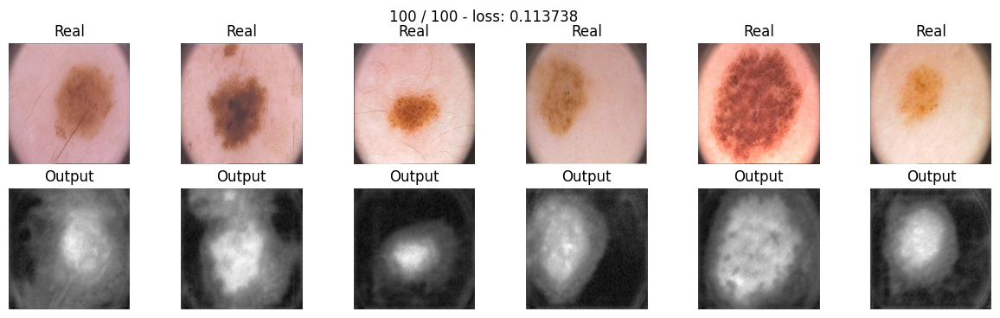

CPU times: user 6min 3s, sys: 20.6 s, total: 6min 24s
Wall time: 5min 36s


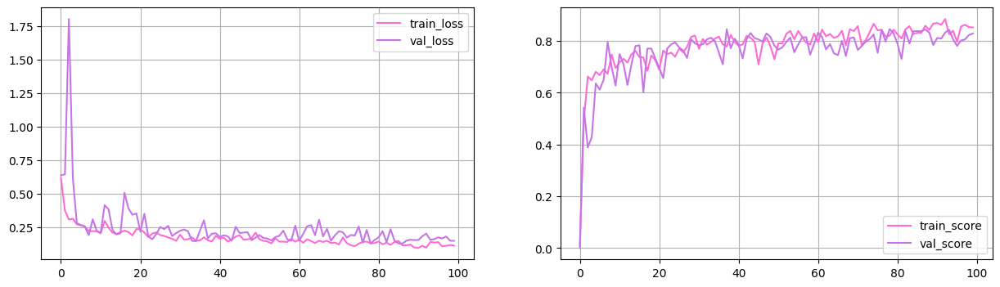

In [ ]:
%%time
max_epochs = 100

optim = torch.optim.Adam(model.parameters())

history = train(model, optim, bce_loss, max_epochs, data_tr, data_val, iou_pytorch)

Let's see what should be boundary for pixels:
* When referring to the boundary for pixels, I'm indicating the value such that if a pixel's value exceeds it, we consider the pixel's value as 1; otherwise, it's considered as 0.

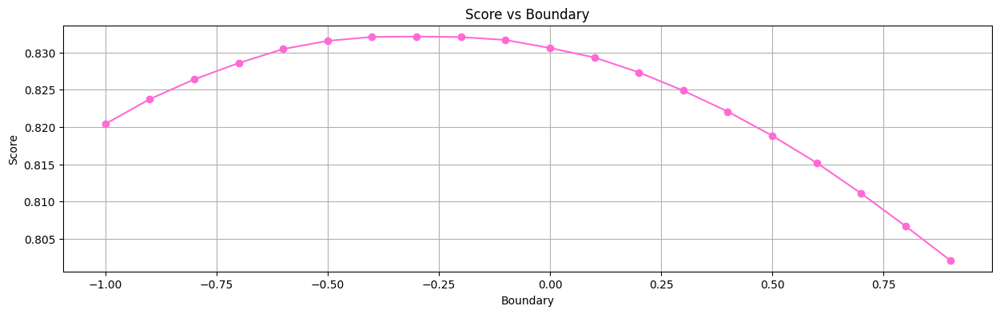

In [ ]:
import matplotlib.pyplot as plt

Scores = []

boundaries = [i / 10.0 for i in range(-10, 10, 1)]

for boundary in boundaries:
    Scores.append(score(model, data_ts, iou_pytorch, boundary))

plt.plot(boundaries, Scores, marker='o', linestyle='-')
plt.title('Score vs Boundary')
plt.xlabel('Boundary')
plt.ylabel('Score')
plt.grid(True)
plt.show()

We observe that a boundary of -0.25 provides a better fit compared to the usual 0.5.But difference of score between them is Very small. So, I will take 0.5 as a boundary.

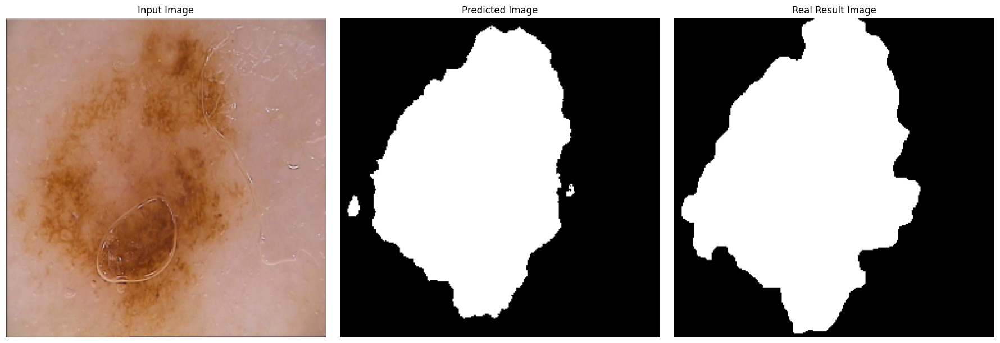

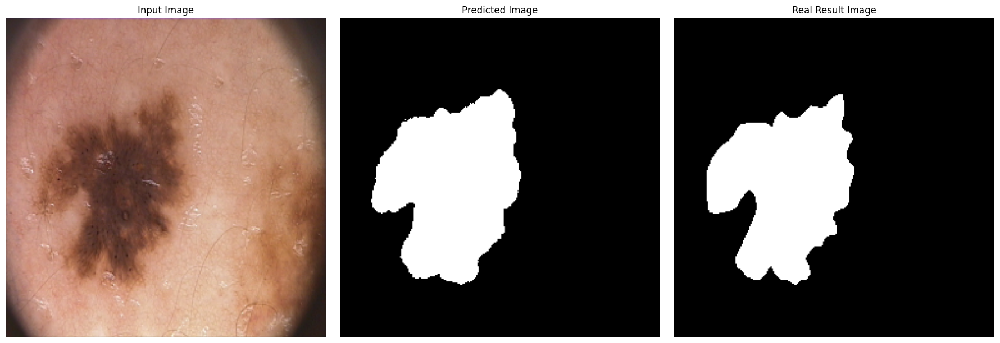

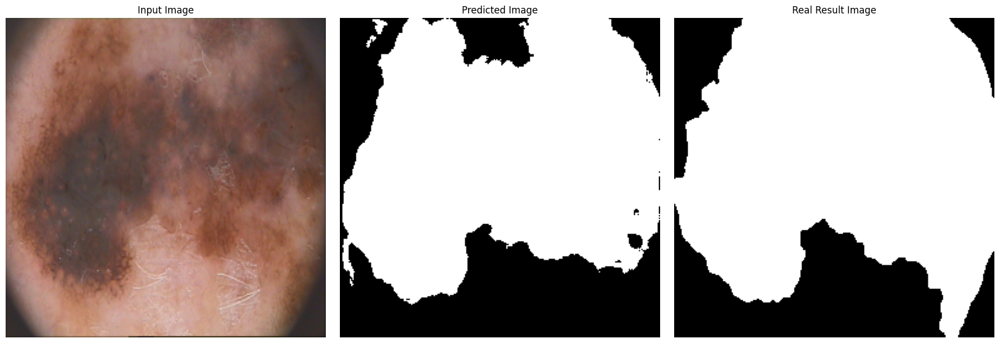

In [ ]:
# I am showing prediction on test set:
predict_visualize(model, data_ts, 0.5, 3)

In [ ]:
print('train score', score(model, data_tr, iou_pytorch, 0.5))
print('validation score', score(model, data_val, iou_pytorch, 0.5))
print('test score', score(model, data_ts, iou_pytorch, 0.5))
r = score(model, data_tr, iou_pytorch, 0.5)

train score tensor(0.8696)
validation score tensor(0.8124)
test score tensor(0.8188)


As we see score in training set is 0.8696, while in test set is 0.8188. The model is slightly overfitted, but performance in test set is not so bad!

In [ ]:
results.loc[-1] = ['Segnet', 'BCE', r]
results = results.reset_index(drop=True)

In [ ]:
results

,model,loss,IoU score
0,Segnet,BCE,tensor(0.8696)


In [ ]:
torch.cuda.empty_cache()
del history

-----------------------------------------------------------------------------------------

## Additional loss functions

In this section let's implement 2 loss functions: DICE and Focal loss.


**1. Dice coefficient:**This function is not differentiable, but that is a necessary property for gradient descent. In this case, we can approximate it using:

$$D(X,Y)=\frac{2|X\cap Y|}{|X|+|Y|}$$

This function is not differentiable, but that is a necessary property for gradient descent. In this case, we can approximate it using:

$$\mathcal L_D(X,Y) = 1-\frac{1}{256 \times 256} \times \frac{\sum_i2X_iY_i}{\sum_iX_i+Y_i}.$$


In [ ]:
# Some coefficient had to be added for the numerator and denominator to prevent something / 0.
def dice_loss(y_real, y_pred):
    y_pred = torch.sigmoid(y_pred)

    union = torch.sum(y_real * y_pred) + 1e-7
    intersection = torch.sum(y_real + y_pred) + 1e-7

    return 1 - 2 * union / intersection

Conducting testing:

### Segnet + DICE loss

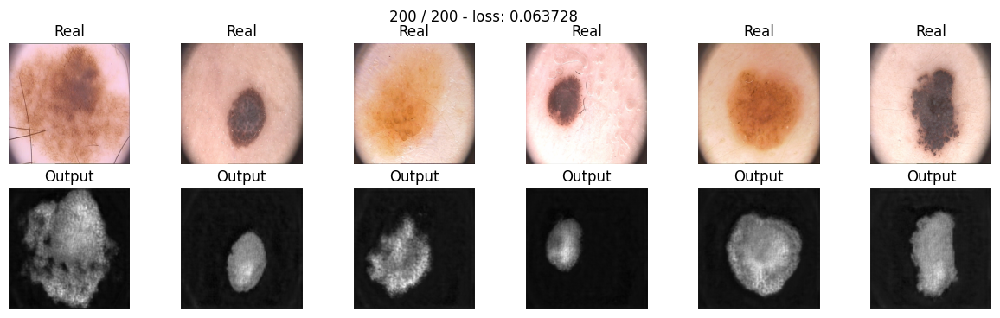

CPU times: user 12min 11s, sys: 40.8 s, total: 12min 52s
Wall time: 11min 17s


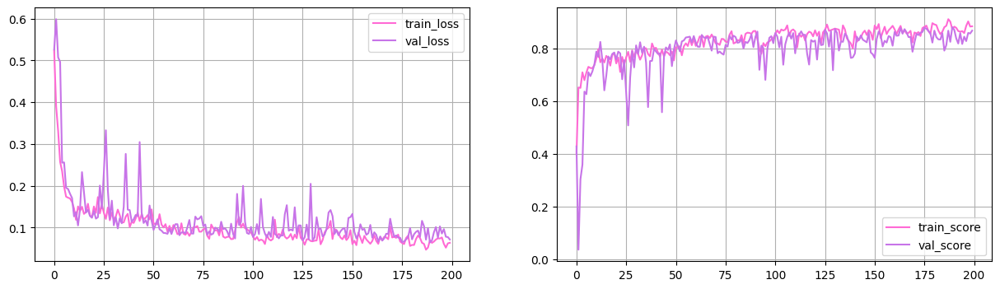

In [ ]:
%%time
dice_model = SegNet().to(device)

max_epochs = 200

optim = torch.optim.Adam(dice_model.parameters())

dice_history = train(dice_model, optim, dice_loss, max_epochs, data_tr, data_val, iou_pytorch)

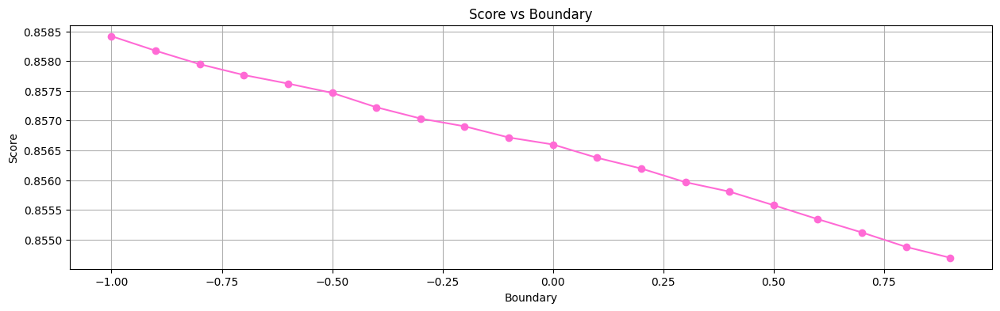

In [ ]:
import matplotlib.pyplot as plt

Scores = []

boundaries = [i / 10.0 for i in range(-10, 10, 1)]

for boundary in boundaries:
    Scores.append(score(dice_model, data_ts, iou_pytorch, boundary))

plt.plot(boundaries, Scores, marker='o', linestyle='-')
plt.title('Score vs Boundary')
plt.xlabel('Boundary')
plt.ylabel('Score')
plt.grid(True)
plt.show()

As we see Score over boundary doesn't vary so much, therefore I will take 0.5 for convenience

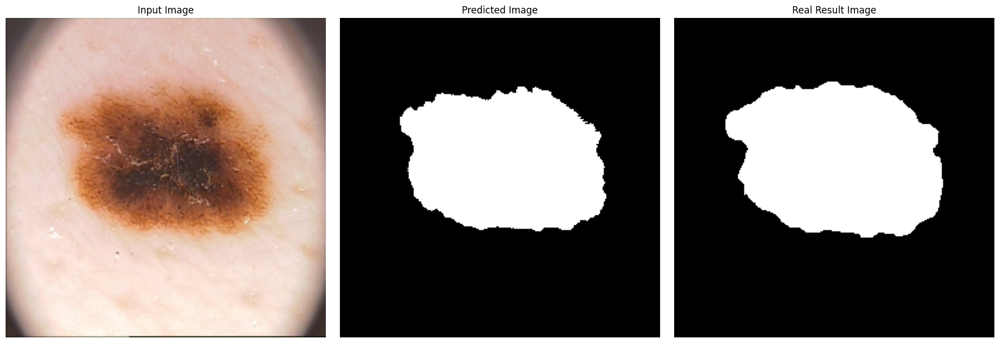

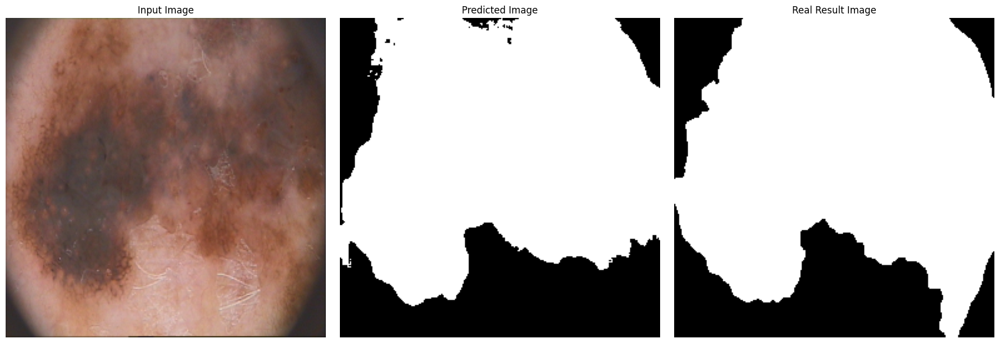

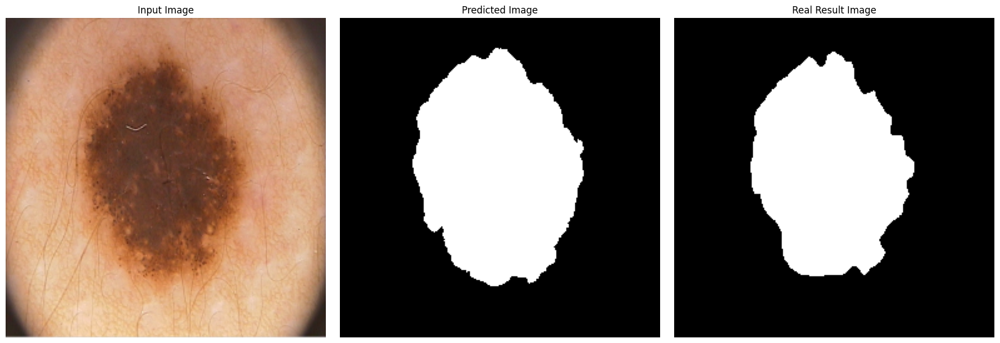

In [ ]:
# I am showing prediction on test set:
predict_visualize(dice_model, data_ts, 0.5, 3)

In [ ]:
print('train score', score(dice_model, data_tr, iou_pytorch, 0.5))
print('validation score', score(dice_model, data_val, iou_pytorch, 0.5))
print('test score', score(dice_model, data_ts, iou_pytorch, 0.5))
r = score(dice_model, data_tr, iou_pytorch, 0.5)

train score tensor(0.8942)
validation score tensor(0.8558)
test score tensor(0.8556)


As we see score in training set is 0.8942, while in test set is 0.8556. This model performs better than previous one. The model is slightly overfitted, but performance in test set is not so bad!

From the graph, we can observe that the score changes less abruptly than in the previous model, which is a positive sign. Additionally, there is less evidence of overfitting.

In [ ]:
results.loc[-1] = ['Segnet', 'DICE', r]
results = results.reset_index(drop=True)

Let's also try focal loss:

In [ ]:
def focal_loss(y_real, y_pred, eps = 1e-6, gamma = 2):
    s = torch.clamp(torch.sigmoid(y_pred), eps, 1 - eps)
    loss = -((1-s)**gamma*y_real*s.log() + s**gamma*(1-y_real)*(1-s).log())
    return loss.mean()

### Segnet + Focal loss

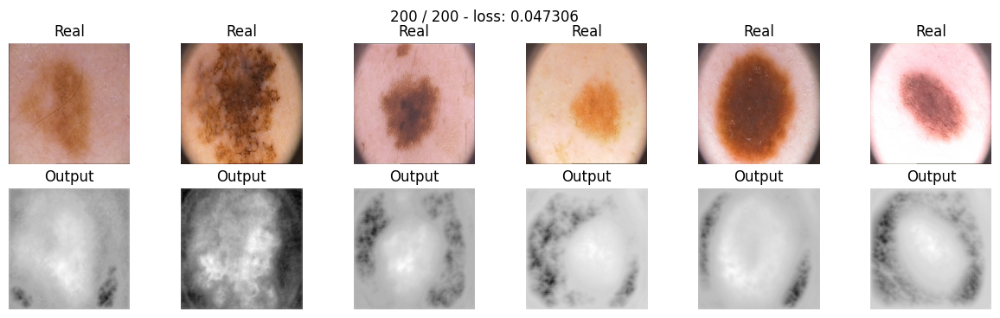

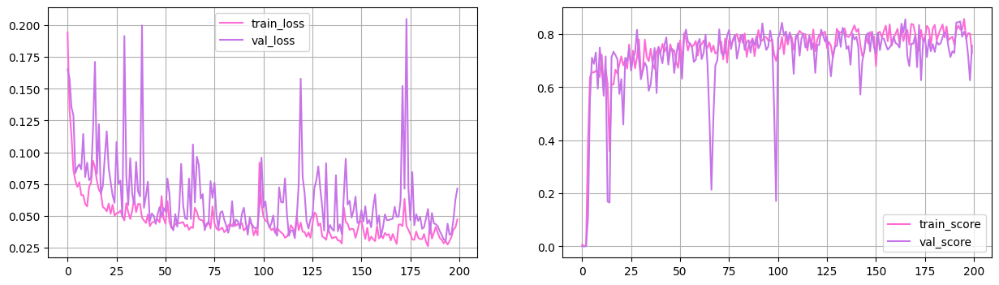

In [ ]:
focal_model = SegNet().to(device)

max_epochs = 200
optimizer = torch.optim.Adam(focal_model.parameters())
focal_history = train(focal_model, optimizer, focal_loss, max_epochs,
                      data_tr, data_val, iou_pytorch)

The plots seem to be more unstable.

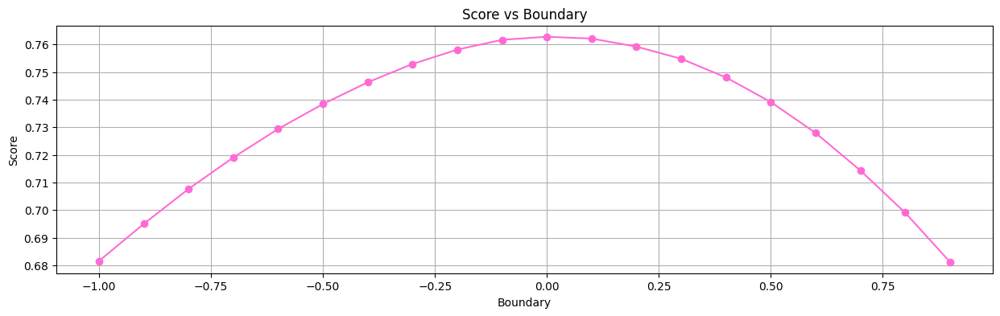

In [ ]:
import matplotlib.pyplot as plt

scores = []

boundaries = [i / 10.0 for i in range(-10, 10, 1)]

for boundary in boundaries:
    scores.append(score(focal_model, data_ts, iou_pytorch, boundary))

plt.plot(boundaries, scores, marker='o', linestyle='-')
plt.title('Score vs Boundary')
plt.xlabel('Boundary')
plt.ylabel('Score')
plt.grid(True)
plt.show()

Here at boundary = 0 score takes the highest value. So I will use boundary as 0.0

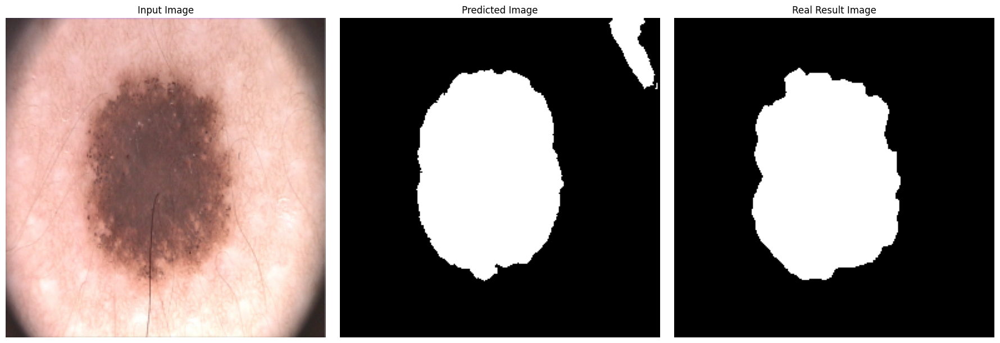

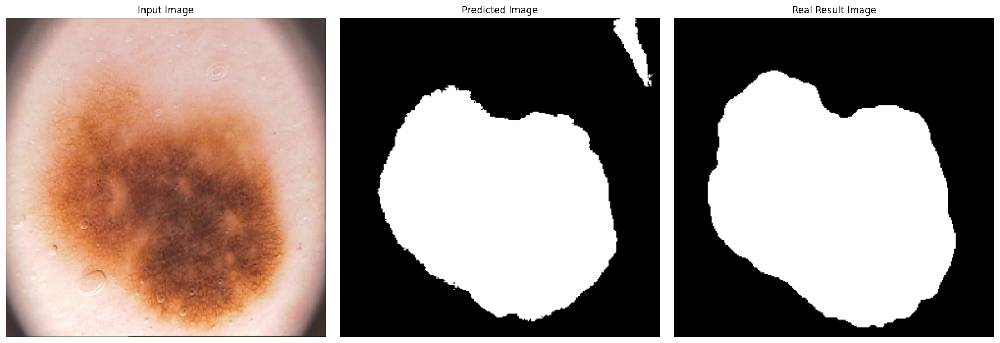

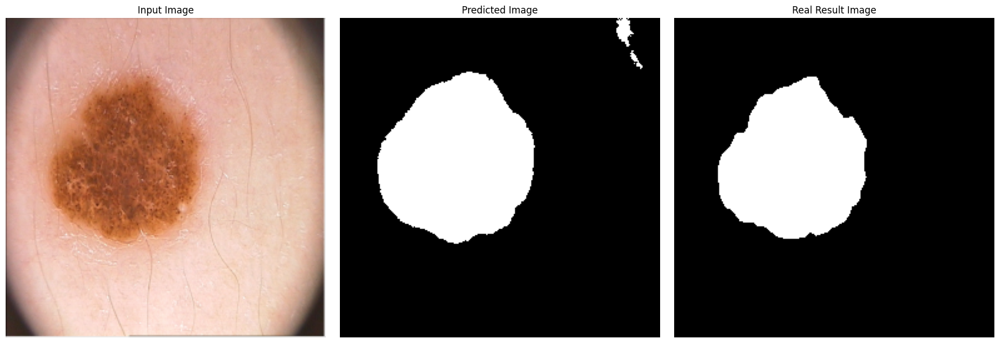

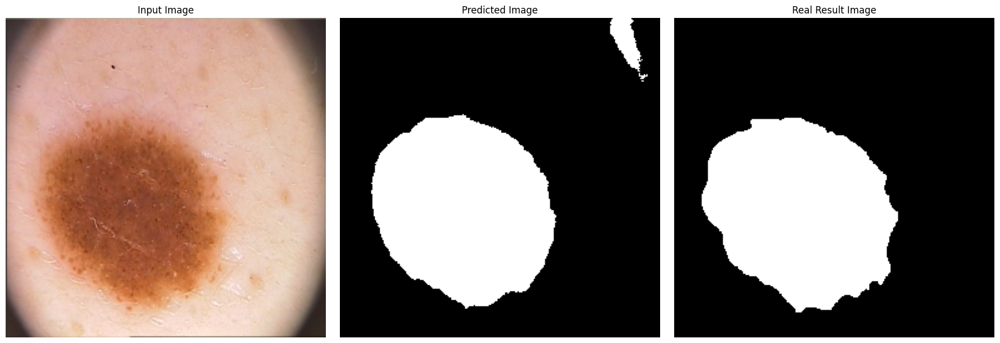

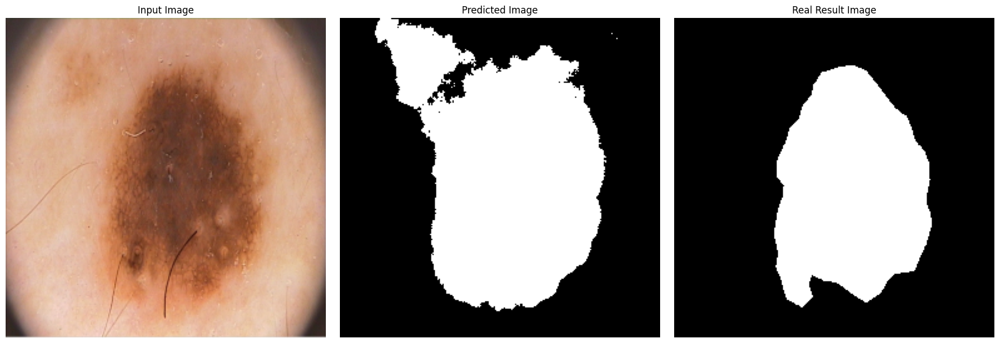

In [ ]:
# I am showing prediction on test set:
predict_visualize(focal_model, data_ts, 0.0, 5)

In [ ]:
print('train score', score(focal_model, data_tr, iou_pytorch, 0.0))
print('validation score', score(focal_model, data_val, iou_pytorch, 0.0))
print('test score', score(focal_model, data_ts, iou_pytorch, 0.0))
r = score(focal_model, data_tr, iou_pytorch, 0.0)

train score tensor(0.7767)
validation score tensor(0.7952)
test score tensor(0.7628)


There is no overfitting, but model performs much worse than 2 previous models.

In [ ]:
results.loc[-1] = ['Segnet', 'focal', r]
results = results.reset_index(drop=True)

In [ ]:
torch.cuda.empty_cache()
del focal_history

----------------------------------------------------------------------------------------------

## [BONUS] Мир сегментационных лоссов [5 баллов]

Взял очень популярный SSIM-loss, который построен на соотвествующем коэффициенте SSSIM, основывая свой код на статье [Correlation Maximized Structural Similarity Loss for Semantic Segmentation](https://arxiv.org/abs/1910.08711) и коде из [репозитория](https://github.com/VainF/pytorch-msssim/tree/master) с реализацией быстрой версии этого лосса. Ниже формула лосса из статьи, которая получена после ряда математических упрощений

Индекс структурного сходства (SSIM) используется для измерения схожести между двумя изображениями, из его достоинств можно выделить:

* учет структуры изображения
* чувствительность к контрасту и яркости
* отсутствие зависимости от масштаба
* SSIM оценивает сходство в локальных окрестностях
* может быть более чувствителен к потере качества при сжатии изображений с сохранением контура

![image.png](attachment:c83a15d6-5dcc-4c7a-8fe0-13042a585d59.png)

In [ ]:
def ssim_loss(y_real, y_pred, C1=1e-6, C2=1e-6):
    x = y_real
    y = torch.sigmoid(y_pred)

    mean_x = torch.mean(x)
    mean_y = torch.mean(y)

    var_x = torch.var(x)
    var_y = torch.var(y)

    cov_xy = torch.mean((x - mean_x) * (y - mean_y))

    numerator = (2 * mean_x * mean_y + C1) * (2 * cov_xy + C2)
    denominator = (mean_x**2 + mean_y**2 + C1) * (var_x + var_y + C2)

    ssim = numerator / denominator

    return 1 - ssim

### Segnet + SSIM loss

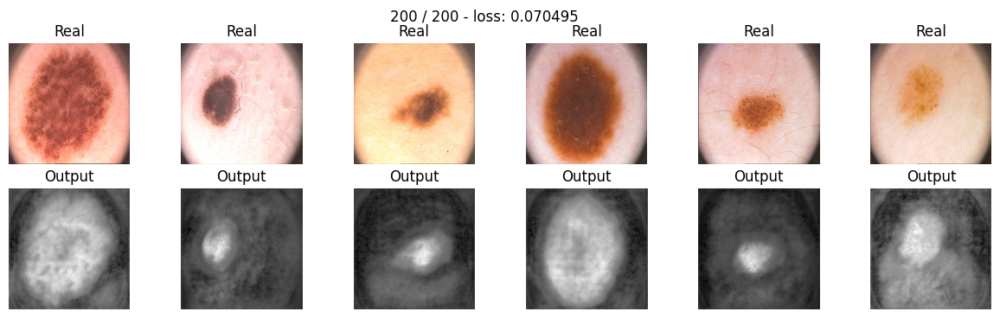

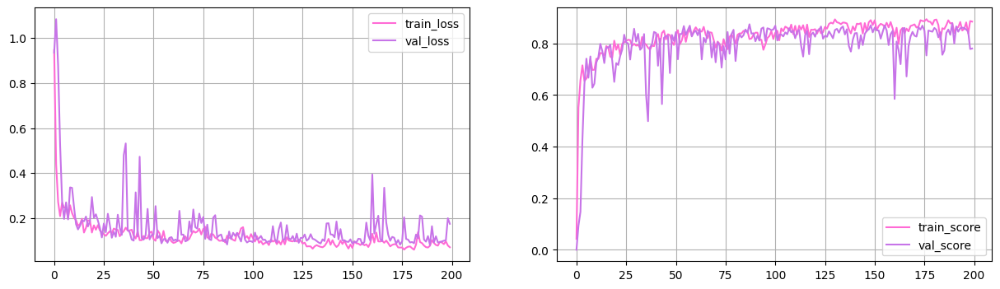

In [ ]:
ssim_model = SegNet().to(device)

max_epochs = 200
optimizer = torch.optim.Adam(ssim_model.parameters())
ssim_history = train(ssim_model, optimizer, ssim_loss, max_epochs,
                      data_tr, data_val, iou_pytorch)

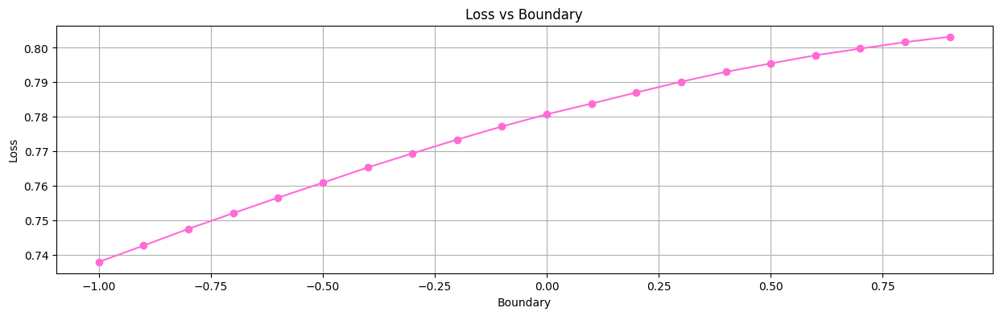

In [ ]:
import matplotlib.pyplot as plt

loss = []

boundaries = [i / 10.0 for i in range(-10, 10, 1)]

for boundary in boundaries:
    loss.append(score(ssim_model, data_ts, iou_pytorch, boundary))

plt.plot(boundaries, loss, marker='o', linestyle='-')
plt.title('Loss vs Boundary')
plt.xlabel('Boundary')
plt.ylabel('Loss')
plt.grid(True)
plt.show()

The maximum score corresponds to a threshold of ~0.8.

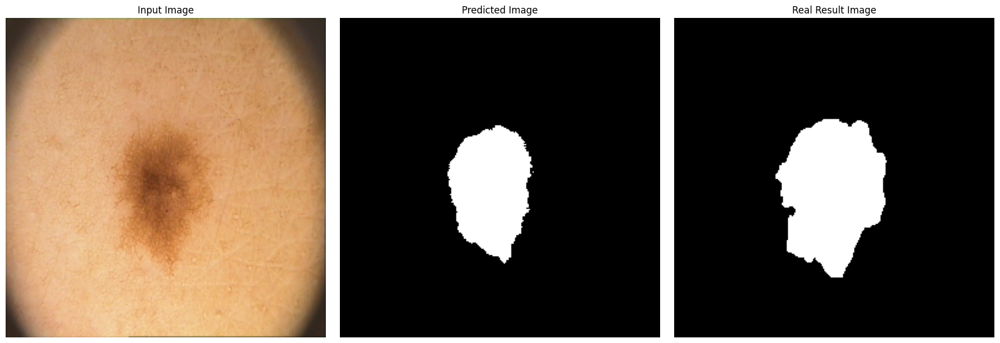

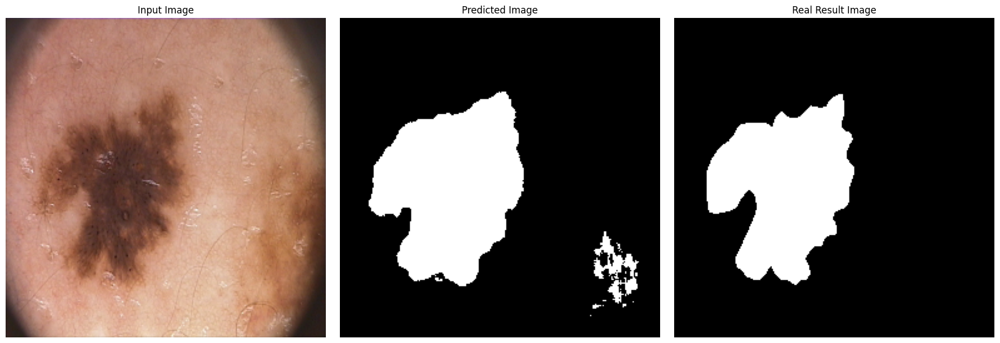

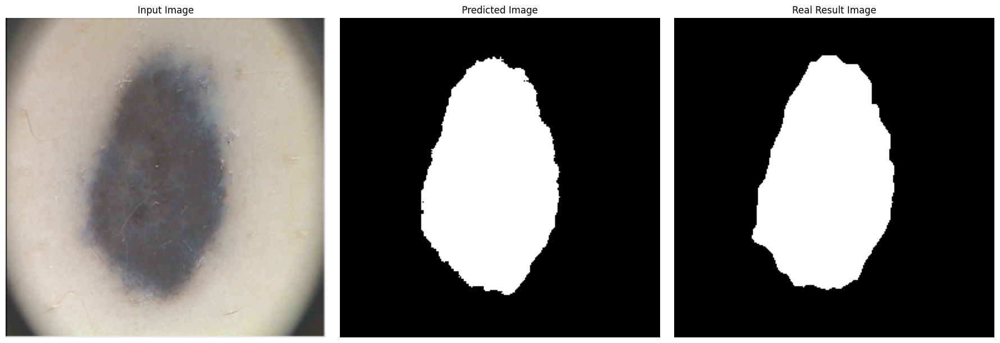

In [ ]:
# I am showing prediction on test set:
predict_visualize(ssim_model, data_ts, 0.8, 3)

In [ ]:
print('train score', score(ssim_model, data_tr, iou_pytorch, 0.8))
print('validation score', score(ssim_model, data_val, iou_pytorch, 0.8))
print('test score', score(ssim_model, data_ts, iou_pytorch, 0.3))
r = score(ssim_model, data_tr, iou_pytorch, 0.75)

train score tensor(0.8636)
validation score tensor(0.7844)
test score tensor(0.7902)


It appears that this combination(Segnet + SSIM loss) is experiencing overfitting. Test score is ~0.8

In [ ]:
results.loc[-1] = ['Segnet', 'SSIM', r]
results = results.reset_index(drop=True)

In [ ]:
import gc
gc.collect()

42399

-----------------------------------------------------------------------------------------

# U-Net [2 балла]

[**U-Net**](https://arxiv.org/abs/1505.04597) — это архитектура нейронной сети, которая получает изображение и выводит его. Первоначально он был задуман для семантической сегментации (как мы ее будем использовать), но он настолько успешен, что с тех пор используется в других контекстах. Получая на вход медицинское изображение, он выведет изображение в оттенках серого, где интенсивность каждого пикселя зависит от вероятности того, что этот пиксель принадлежит интересующей нас области.

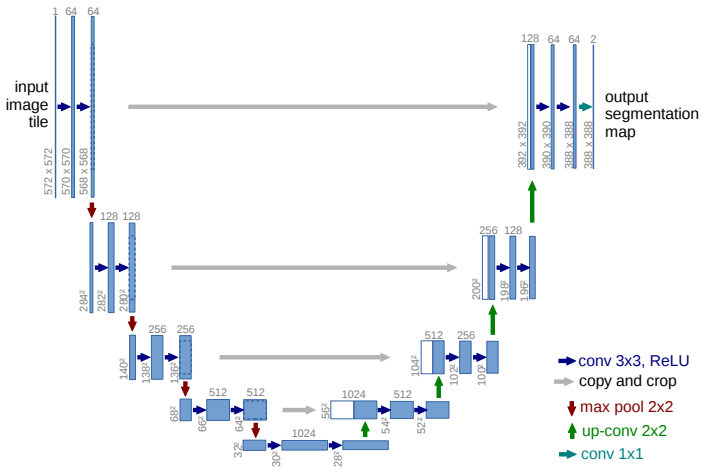

У нас в архитектуре все так же существует энкодер и декодер, как в **SegNet**, но отличительной особеностью данной модели являются *skip-conenctions*, соединяющие части декодера и энкодера. То есть для того чтобы передать на вход декодера тензор, мы конкатенируем симметричный выход с энкодера и выход предыдущего слоя декодера.

* Ronneberger, Olaf, Philipp Fischer, and Thomas Brox. "[U-Net: Convolutional networks for biomedical image segmentation.](https://arxiv.org/pdf/1505.04597.pdf)" International Conference on Medical image computing and computer-assisted intervention. Springer, Cham, 2015.

In [ ]:
class UNet(nn.Module):
    def __init__(self):
        super().__init__()

        self.enc_conv0 = nn.Sequential(nn.Conv2d(in_channels=3, out_channels=64,
                                                 kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=64),
                                       nn.ReLU(inplace=True),

                                       nn.Conv2d(in_channels=64, out_channels=64,
                                                kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=64),
                                       nn.ReLU(inplace=True))

        # 256 -> 128
        self.pool0 = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        self.enc_conv1 = nn.Sequential(nn.Conv2d(in_channels=64, out_channels=128,
                                                 kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=128),
                                       nn.ReLU(inplace=True),

                                       nn.Conv2d(in_channels=128, out_channels=128,
                                                kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=128),
                                       nn.ReLU(inplace=True))

        # 128 -> 64
        self.pool1 = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        self.enc_conv2 = nn.Sequential(nn.Conv2d(in_channels=128, out_channels=256,
                                                 kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=256),
                                       nn.ReLU(inplace=True),

                                       nn.Conv2d(in_channels=256, out_channels=256,
                                                kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=256),
                                       nn.ReLU(inplace=True),

                                       nn.Conv2d(in_channels=256, out_channels=256,
                                                kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=256),
                                       nn.ReLU(inplace=True))

        # 64 -> 32
        self.pool2 = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        self.enc_conv3 = nn.Sequential(nn.Conv2d(in_channels=256, out_channels=512,
                                                 kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=512),
                                       nn.ReLU(inplace=True),

                                       nn.Conv2d(in_channels=512, out_channels=512,
                                                kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=512),
                                       nn.ReLU(inplace=True),

                                       nn.Conv2d(in_channels=512, out_channels=512,
                                                kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=512),
                                       nn.ReLU(inplace=True))

        # 32 -> 16
        self.pool3 = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        # bottleneck
        self.bottleneck_conv = nn.Sequential(nn.Conv2d(in_channels=512, out_channels=256,
                                                       kernel_size=1, stride=1),
                                             nn.BatchNorm2d(256),
                                             nn.ReLU(inplace=True),

                                             nn.Conv2d(in_channels=256, out_channels=256,
                                                       kernel_size=3, padding=1, stride=1),
                                             nn.BatchNorm2d(256),
                                             nn.ReLU(inplace=True),

                                             nn.Conv2d(in_channels=256, out_channels=512,
                                                       kernel_size=1),
                                             nn.BatchNorm2d(512),
                                             nn.ReLU(inplace=True))

        # decoder (upsampling)

        # 16 -> 32
        self.upsample0 = nn.Upsample(scale_factor=2, mode='nearest')

        self.dec_conv0 = nn.Sequential(nn.Conv2d(in_channels=1024, out_channels=512,
                                                 kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=512),
                                       nn.ReLU(inplace=True),

                                       nn.Conv2d(in_channels=512, out_channels=512,
                                                kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=512),
                                       nn.ReLU(inplace=True),

                                       nn.Conv2d(in_channels=512, out_channels=256,
                                                kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=256),
                                       nn.ReLU(inplace=True))

        # 32 -> 64
        self.upsample1 = nn.Upsample(scale_factor=2, mode='nearest')

        self.dec_conv1 = nn.Sequential(nn.Conv2d(in_channels=512, out_channels=256,
                                                 kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=256),
                                       nn.ReLU(inplace=True),

                                       nn.Conv2d(in_channels=256, out_channels=256,
                                                kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=256),
                                       nn.ReLU(inplace=True),

                                       nn.Conv2d(in_channels=256, out_channels=128,
                                                kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=128),
                                       nn.ReLU(inplace=True))

        # 64 -> 128
        self.upsample2 = nn.Upsample(scale_factor=2, mode='nearest')

        self.dec_conv2 = nn.Sequential(nn.Conv2d(in_channels=256, out_channels=128,
                                                 kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=128),
                                       nn.ReLU(inplace=True),

                                       nn.Conv2d(in_channels=128, out_channels=64,
                                                kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=64),
                                       nn.ReLU(inplace=True))

        # 128 -> 256
        self.upsample3 = nn.Upsample(scale_factor=2, mode='nearest')

        self.dec_conv3 = nn.Sequential(nn.Conv2d(in_channels=128, out_channels=64,
                                                 kernel_size=3, padding=1, stride=1),
                                       nn.BatchNorm2d(num_features=64),
                                       nn.ReLU(inplace=True),

                                       nn.Conv2d(in_channels=64, out_channels=1,
                                                kernel_size=3, padding=1, stride=1))

    def forward(self, x):
        # encoder
        e0 = self.enc_conv0(x)
        p0 = self.pool0(e0)
        e1 = self.enc_conv1(p0)
        p1 = self.pool1(e1)
        e2 = self.enc_conv2(p1)
        p2 = self.pool2(e2)
        e3 = self.enc_conv3(p2)
        p3 = self.pool3(e3)

        # bottleneck
        b = self.bottleneck_conv(p3)

        # decoder
        d0 = self.dec_conv0(torch.cat((self.upsample0(b), e3), dim=1))
        d1 = self.dec_conv1(torch.cat((self.upsample1(d0), e2), dim=1))
        d2 = self.dec_conv2(torch.cat((self.upsample2(d1), e1), dim=1))
        d3 = self.dec_conv3(torch.cat((self.upsample3(d2), e0), dim=1))
        return d3

### Unet + BCE loss

In [ ]:
unet_model = UNet().to(device)
summary(unet_model, input_size=(batch_size, 3, 256, 256))

Layer (type:depth-idx)                   Output Shape              Param #
UNet                                     [16, 1, 256, 256]         --
├─Sequential: 1-1                        [16, 64, 256, 256]        --
│    └─Conv2d: 2-1                       [16, 64, 256, 256]        1,792
│    └─BatchNorm2d: 2-2                  [16, 64, 256, 256]        128
│    └─ReLU: 2-3                         [16, 64, 256, 256]        --
│    └─Conv2d: 2-4                       [16, 64, 256, 256]        36,928
│    └─BatchNorm2d: 2-5                  [16, 64, 256, 256]        128
│    └─ReLU: 2-6                         [16, 64, 256, 256]        --
├─MaxPool2d: 1-2                         [16, 64, 128, 128]        --
├─Sequential: 1-3                        [16, 128, 128, 128]       --
│    └─Conv2d: 2-7                       [16, 128, 128, 128]       73,856
│    └─BatchNorm2d: 2-8                  [16, 128, 128, 128]       256
│    └─ReLU: 2-9                         [16, 128, 128, 128]       --
│

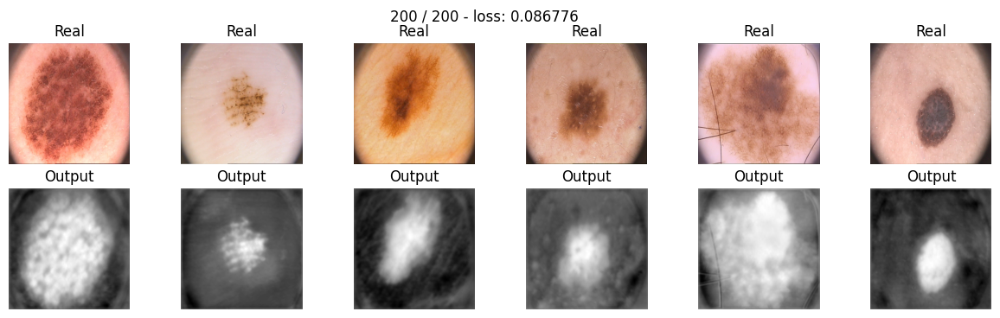

CPU times: user 13min 37s, sys: 33.8 s, total: 14min 11s
Wall time: 12min 39s


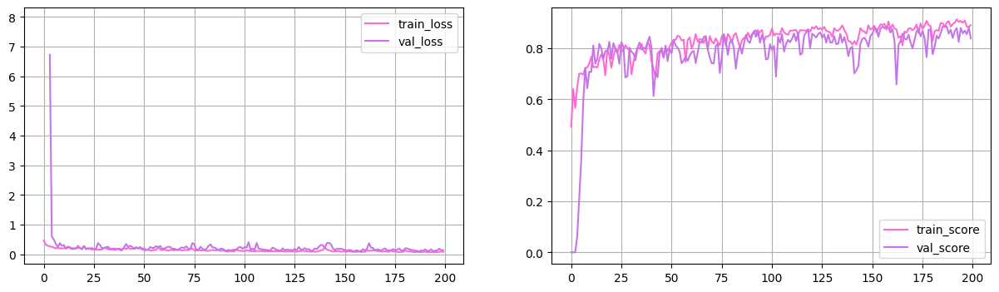

In [ ]:
%%time

max_epochs = 200

optim = torch.optim.Adam(unet_model.parameters())

unet_history = train(unet_model, optim, bce_loss, max_epochs, data_tr, data_val, iou_pytorch)

As we see loss converges very fast

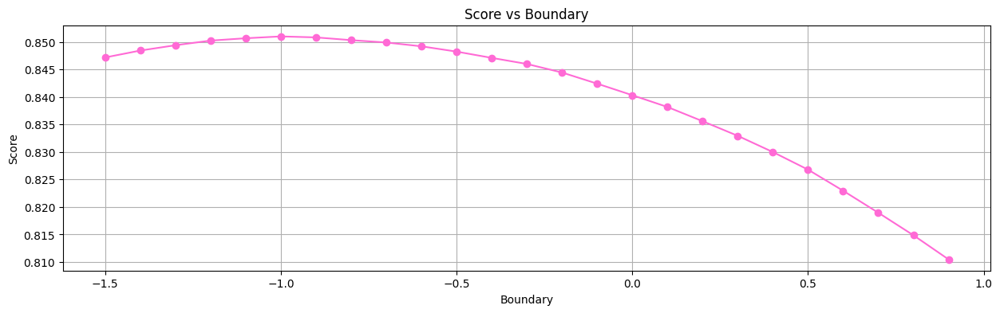

In [ ]:
import matplotlib.pyplot as plt

scores = []

boundaries = [i / 10.0 for i in range(-15, 10, 1)]

for boundary in boundaries:
    scores.append(score(unet_model, data_ts, iou_pytorch, boundary))

plt.plot(boundaries, scores, marker='o', linestyle='-')
plt.title('Score vs Boundary')
plt.xlabel('Boundary')
plt.ylabel('Score')
plt.grid(True)
plt.show()

As we see threshold of -1.0 has highest score for this case, therefore I will use it:

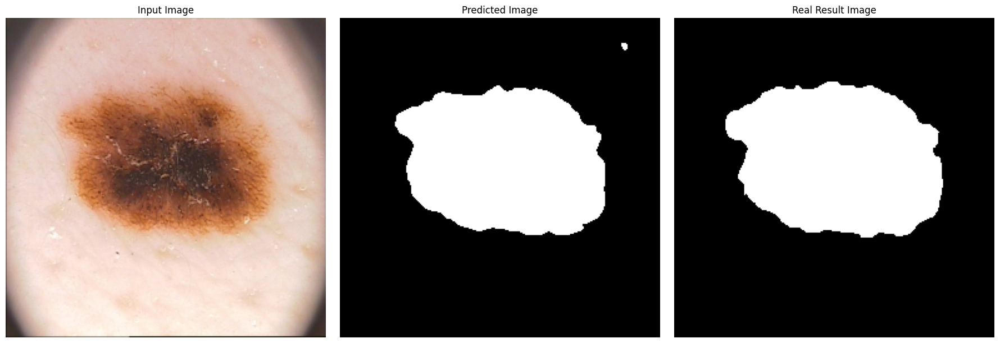

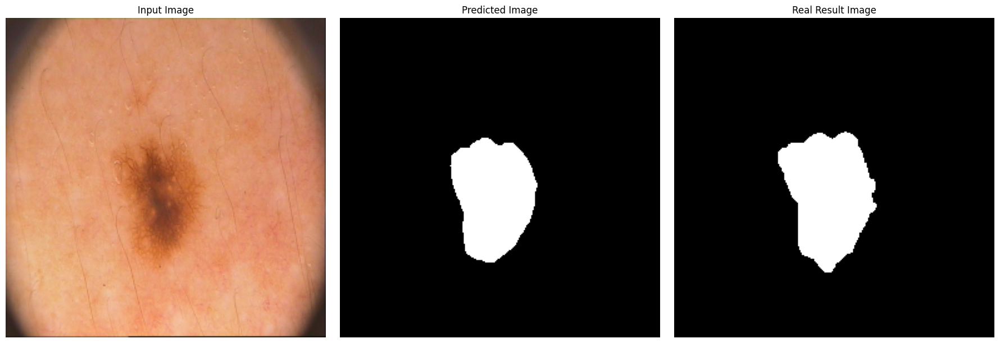

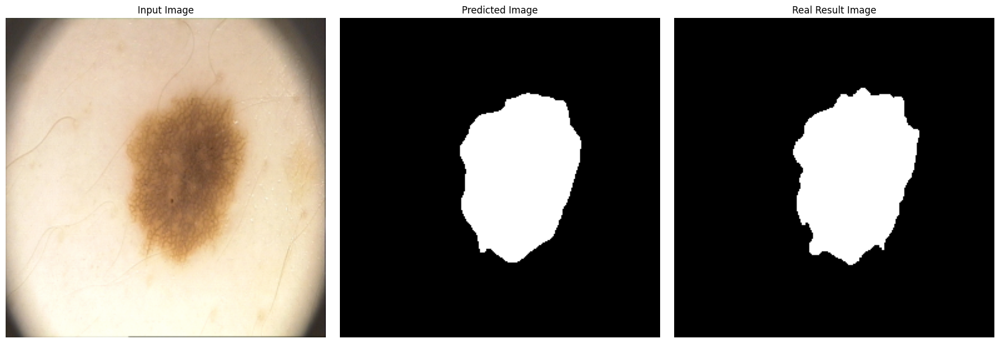

In [ ]:
# I am showing prediction on test set:
predict_visualize(unet_model, data_ts, -1.0, 3)

In [ ]:
print('train score', score(unet_model, data_tr, iou_pytorch, -1.0))
print('validation score', score(unet_model, data_val, iou_pytorch, -1.0))
print('test score', score(unet_model, data_ts, iou_pytorch, -1.0))
r = score(unet_model, data_tr, iou_pytorch, -1.0)

train score tensor(0.8963)
validation score tensor(0.8571)
test score tensor(0.8510)


This combination(Unet + BCE loss) performs really good, but there is still overfitting.

In [ ]:
results.loc[-1] = ['Unet', 'BCE', r]
results = results.reset_index(drop=True)

In [ ]:
torch.cuda.empty_cache()
del unet_history

### Unet + DICE loss

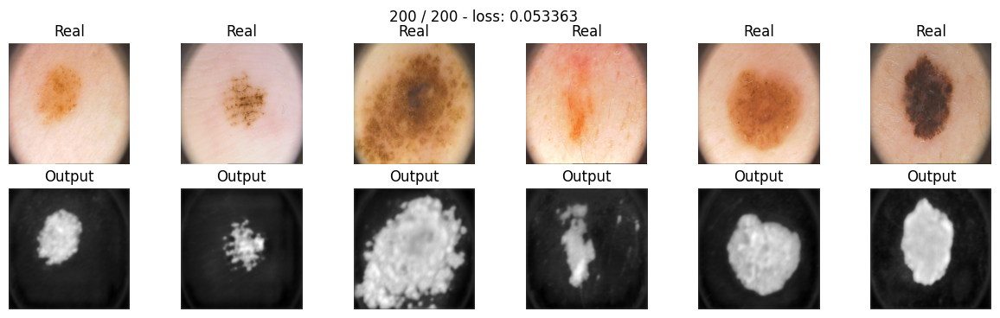

CPU times: user 13min 36s, sys: 33.3 s, total: 14min 10s
Wall time: 12min 37s


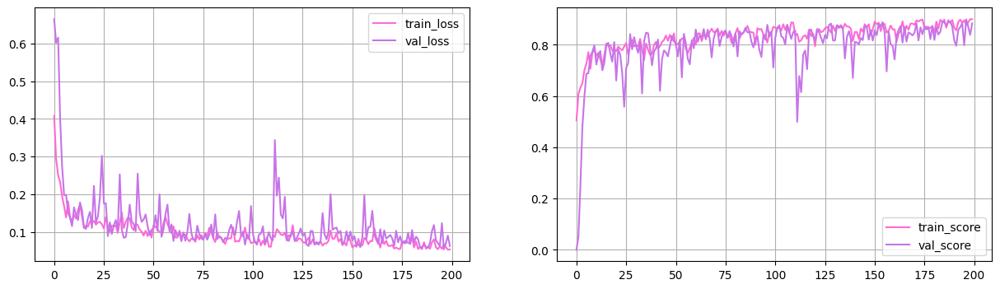

In [ ]:
%%time
dice_unet_model = UNet().to(device)
max_epochs = 200

optim = torch.optim.Adam(dice_unet_model.parameters())
dice_unet_history = train(dice_unet_model, optim, dice_loss, max_epochs, data_tr, data_val, iou_pytorch)

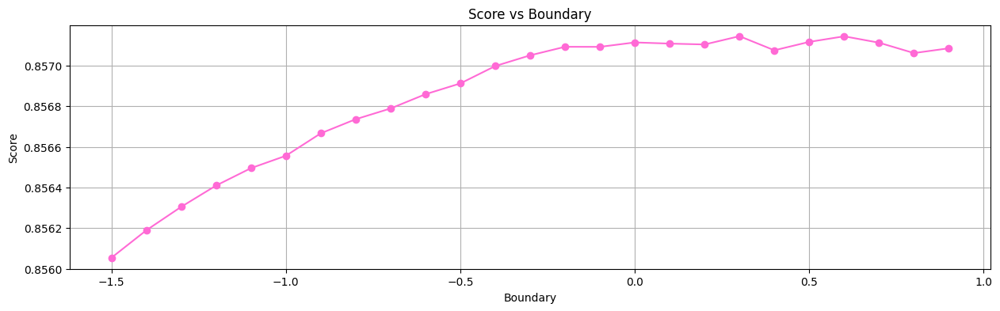

In [ ]:
import matplotlib.pyplot as plt

scores = []

boundaries = [i / 10.0 for i in range(-15, 10, 1)]

for boundary in boundaries:
    scores.append(score(dice_unet_model, data_ts, iou_pytorch, boundary))

plt.plot(boundaries, scores, marker='o', linestyle='-')
plt.title('Score vs Boundary')
plt.xlabel('Boundary')
plt.ylabel('Score')
plt.grid(True)
plt.show()

Threshold of 0.5 is suitable.

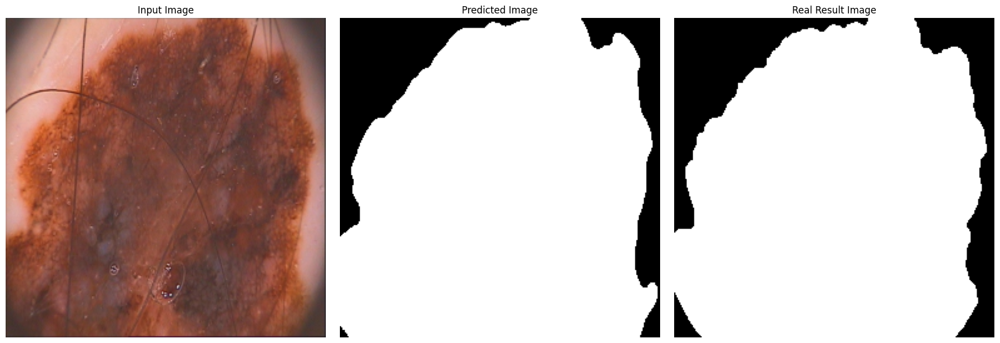

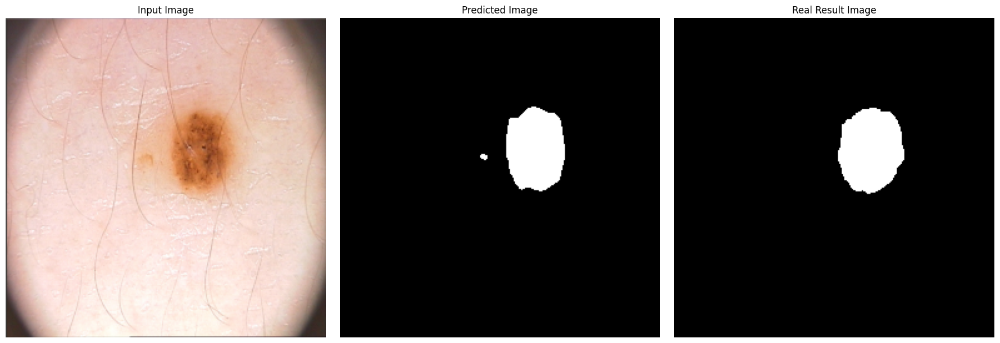

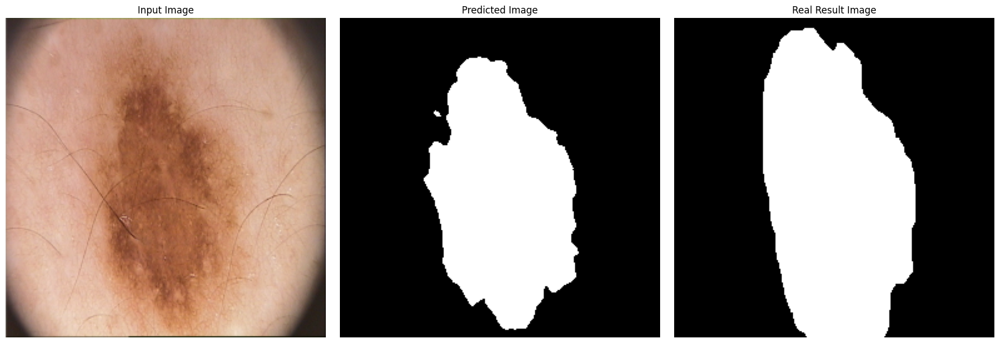

In [ ]:
# I am showing prediction on test set:
predict_visualize(dice_unet_model, data_ts, 0.5, 3)

In [ ]:
print('train score', score(dice_unet_model, data_tr, iou_pytorch, 0.5))
print('validation score', score(dice_unet_model, data_val, iou_pytorch, 0.5))
print('test score', score(dice_unet_model, data_ts, iou_pytorch, 0.5))
r = score(dice_unet_model, data_tr, iou_pytorch, 0.5)

train score tensor(0.9012)
validation score tensor(0.8764)
test score tensor(0.8571)


In [ ]:
results.loc[-1] = ['Unet', 'DICE', r]
results = results.reset_index(drop=True)

In [ ]:
torch.cuda.empty_cache()
del dice_unet_history

### Unet + SSIM loss

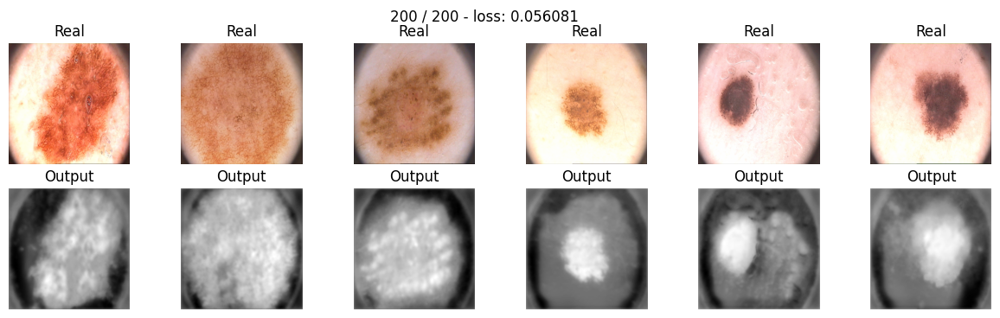

CPU times: user 13min 37s, sys: 32.7 s, total: 14min 10s
Wall time: 12min 38s


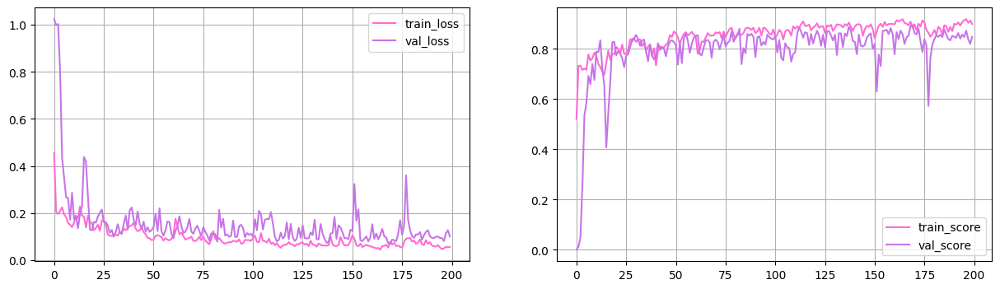

In [ ]:
%%time
ssim_unet_model = UNet().to(device)
max_epochs = 200

optim = torch.optim.Adam(ssim_unet_model.parameters())
ssim_unet_history = train(ssim_unet_model, optim, ssim_loss, max_epochs, data_tr, data_val, iou_pytorch)

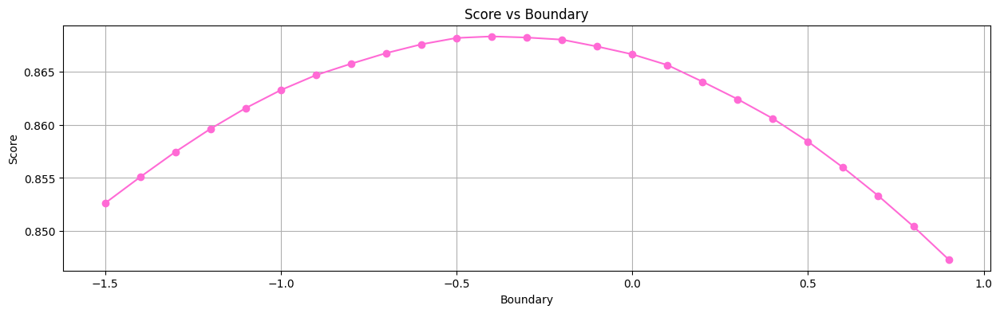

In [ ]:
import matplotlib.pyplot as plt

scores = []

boundaries = [i / 10.0 for i in range(-15, 10, 1)]

for boundary in boundaries:
    scores.append(score(ssim_unet_model, data_ts, iou_pytorch, boundary))

plt.plot(boundaries, scores, marker='o', linestyle='-')
plt.title('Score vs Boundary')
plt.xlabel('Boundary')
plt.ylabel('Score')
plt.grid(True)
plt.show()

-0.5 is a good threshold.

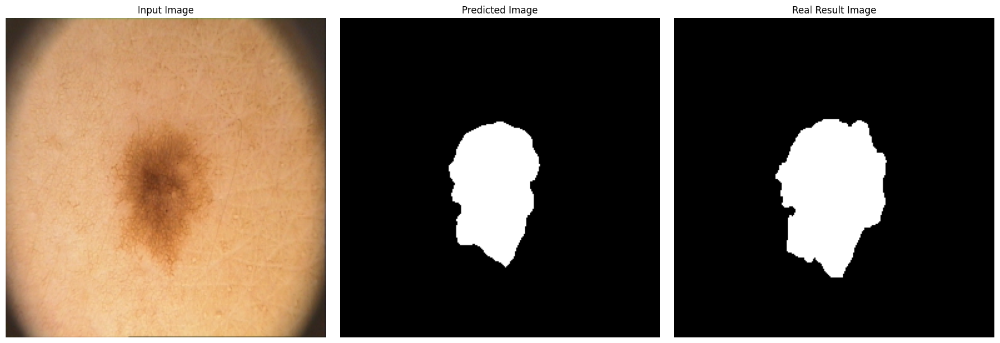

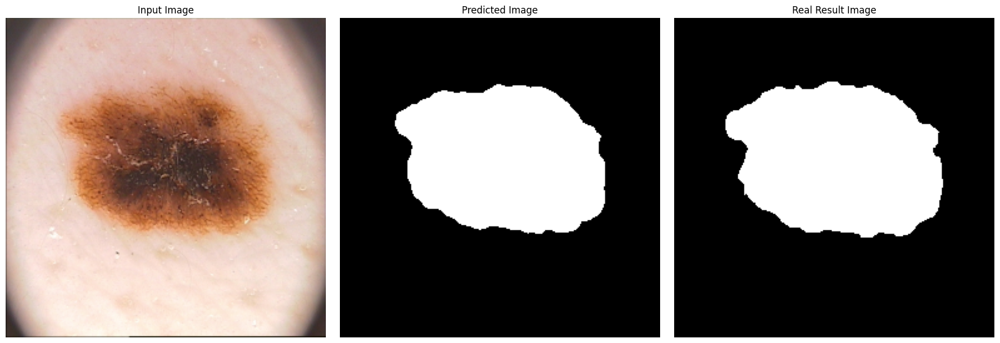

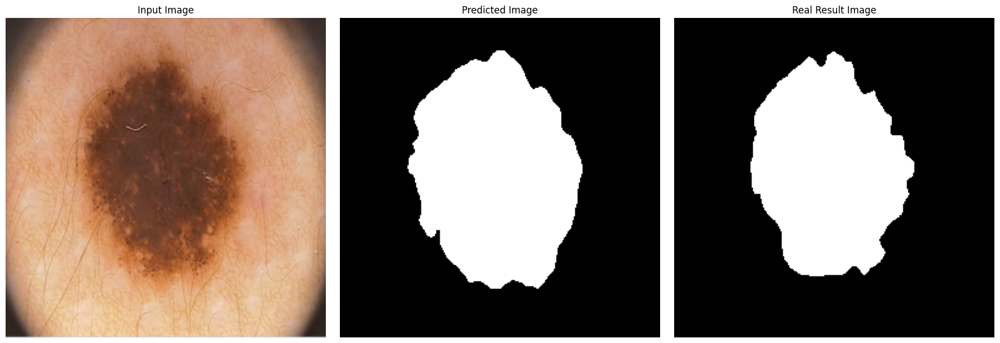

In [ ]:
# I am showing prediction on test set:
predict_visualize(ssim_unet_model, data_ts, -0.5, 3)

In [ ]:
print('train score', score(ssim_unet_model, data_tr, iou_pytorch, -0.5))
print('validation score', score(ssim_unet_model, data_val, iou_pytorch, -0.5))
print('test score', score(ssim_unet_model, data_ts, iou_pytorch, -0.5))
r = score(ssim_unet_model, data_tr, iou_pytorch, -0.5)

train score tensor(0.9130)
validation score tensor(0.8658)
test score tensor(0.8682)


This combination (Unet + SSIM loss) performs better than all others above, with score of 0.8682 on test set.There is still overfitting.

In [ ]:
results.loc[-1] = ['Unet', 'SSIM', r]
results = results.reset_index(drop=True)

In [ ]:
torch.cuda.empty_cache()
del ssim_unet_history

---

Сделайте вывод, какая из моделей лучше

## Conclusions to the report

In [ ]:
results

,model,loss,IoU score
0,Segnet,BCE,tensor(0.8696)
1,Segnet,DICE,tensor(0.8942)
2,Segnet,focal,tensor(0.8749)
3,Segnet,SSIM,tensor(0.8622)
4,Segnet,SSIM,tensor(0.7767)
5,Unet,BCE,tensor(0.8963)
6,Unet,DICE,tensor(0.9012)
7,Unet,DICE,tensor(0.9012)
8,Unet,SSIM,tensor(0.9130)


In [ ]:
best_model = results[['model', 'loss']].iloc[results['IoU score'].argmax()]
print(f'Best model: {" ".join(best_model)} | IoU score: {results["IoU score"].max()}')

Best model: Unet SSIM | IoU score: 0.9130123853683472


In [ ]:
del results

As we see combination (Unet model + SSIM loss) is the best choice for this problem!